# PIL - Python Imaging Library

In [153]:
from PIL import Image
from pylab import *
from scipy.misc import imsave
from scipy.ndimage import filters, measurements, morphology
import numpy as np
import os
import scipy.misc as misc

%matplotlib inline

In [157]:
fig_size = [16, 9]
plt.rcParams['figure.figsize'] = fig_size

In [194]:
!ls ../../images

balls.jpg       charboSmall.jpg dice.png        gorilla.jpg
charboLarge.jpg dice.jpg        diceGrey.png


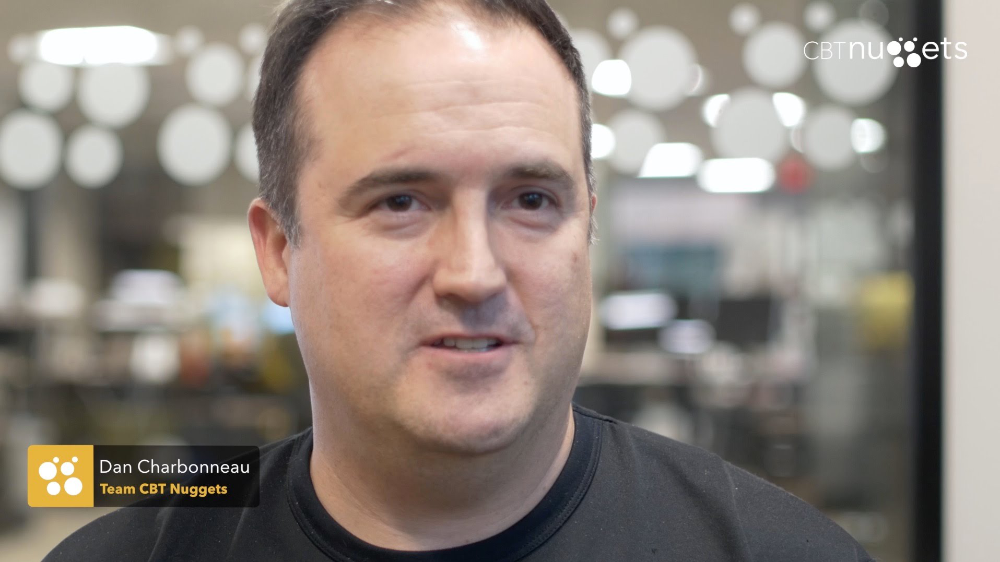

In [210]:
image = '../../images/charboLarge.jpg'
pil_im = Image.open(image)
pil_im

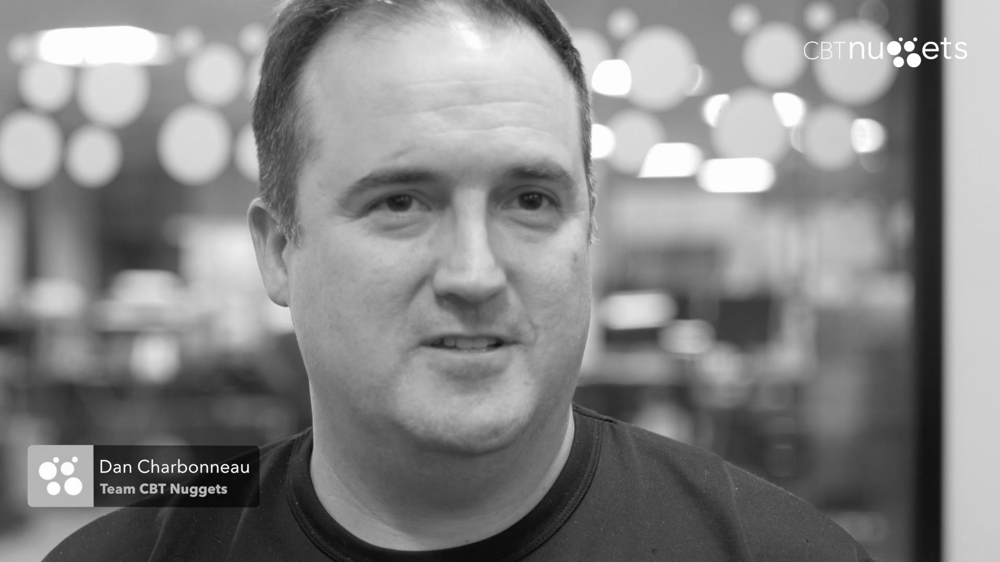

In [211]:
pil_im_grey = Image.open(image).convert('L')
pil_im_grey

In [212]:
# Convert image format
#Image.open('../../images/dice.png').save('../../images/dice.jpg')

# Automate for all files in directory:
#for infile in filelist:
#    outfile = os.path.splitext(infile)[0] + '.jpg'
#    if infile != outfile:
#        try:
#            Image.open(infile).save(outfile)
#        except IOError:
#            print 'Cannot convert', infile

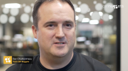

In [213]:
# Create thumbnails
pil_thumb = Image.open(image)
pil_thumb.thumbnail((128, 128)) # Note: aspect ratio preserved
pil_thumb

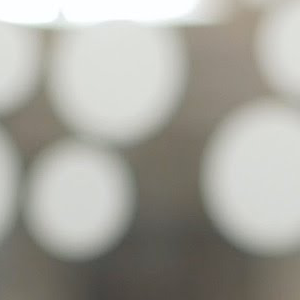

In [214]:
mask = (100, 100, 400, 400)
region = pil_im.crop(mask)
region

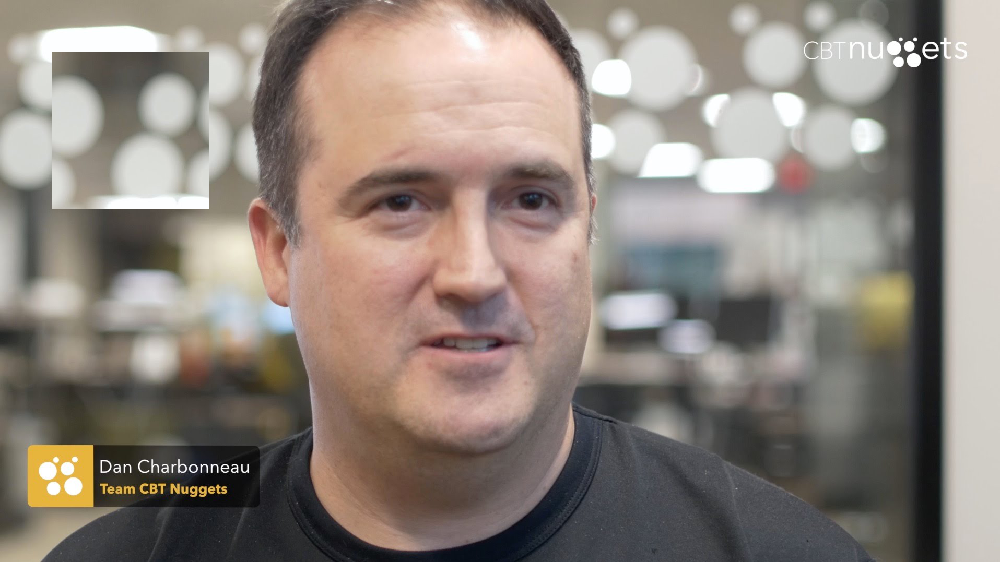

In [215]:
region = region.transpose(Image.ROTATE_180)
pil_im.paste(region, mask)
pil_im

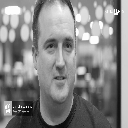

In [216]:
# Resize
grey_mini = pil_im_grey.resize((128, 128)) # Aspect ratio not preserved
grey_mini

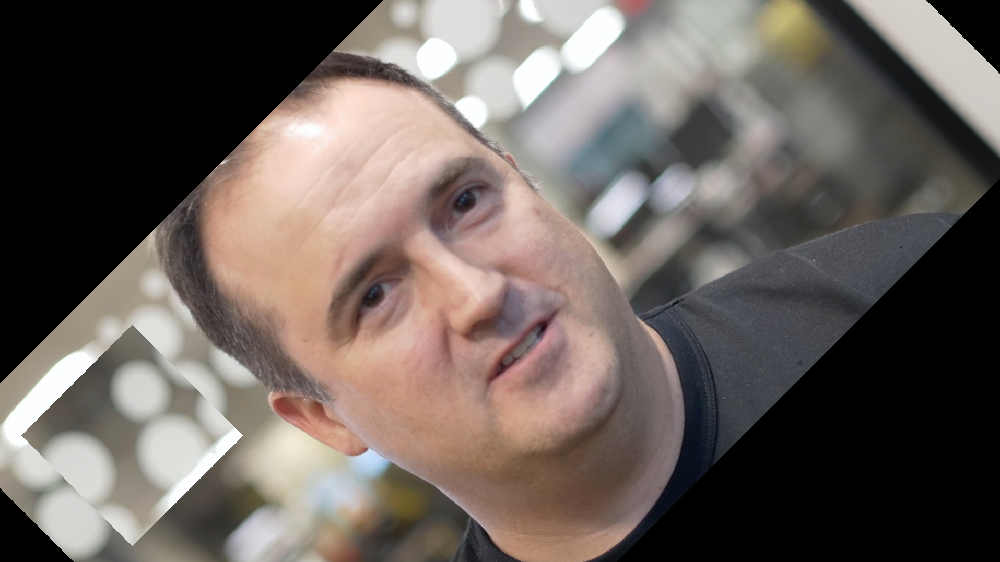

In [217]:
# Rotate
balls_45 = pil_im.rotate(45)
balls_45

# Matplotlib Integration

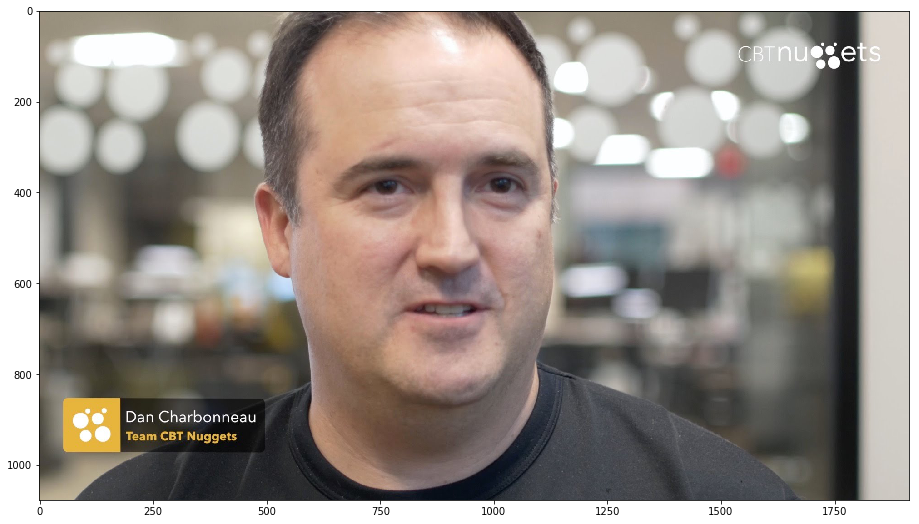

In [218]:
# Read image to array
im = array(Image.open(image))
imshow(im);

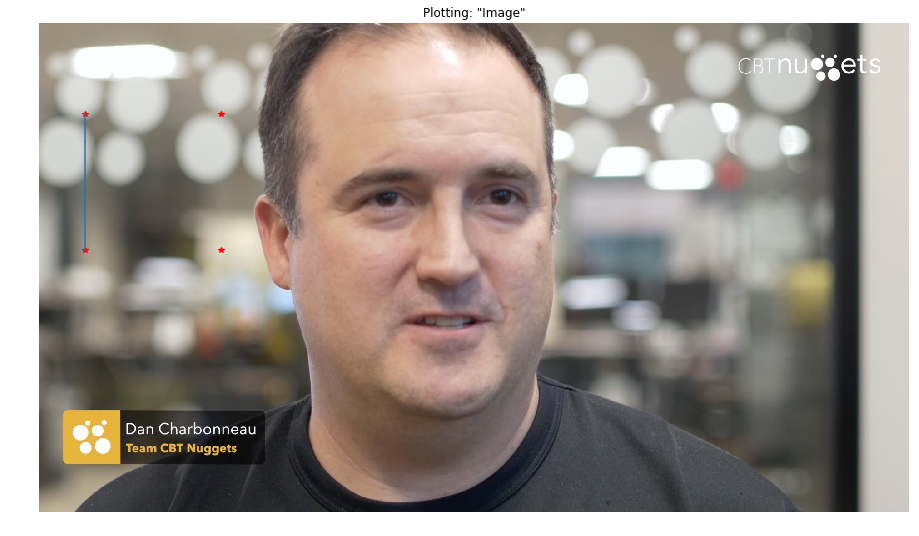

In [219]:
# Add some points
x = [100, 100, 400, 400]
y = [200, 500, 200, 500]
imshow(im);
plot(x, y, 'r*');
plot(x[:2], y[:2]);
axis('off')
title('Plotting: "Image"');

(0.5, 1914.5, 0.5, 1076.5)

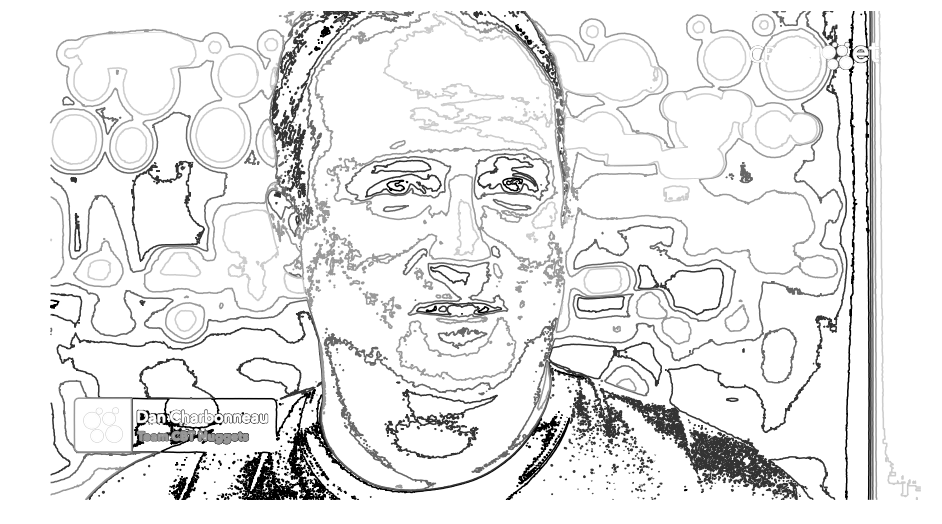

In [220]:
# Image Contours
im = array(pil_im_grey)
figure()
gray()
contour(im, origin = 'image')
axis('equal')
axis('off')

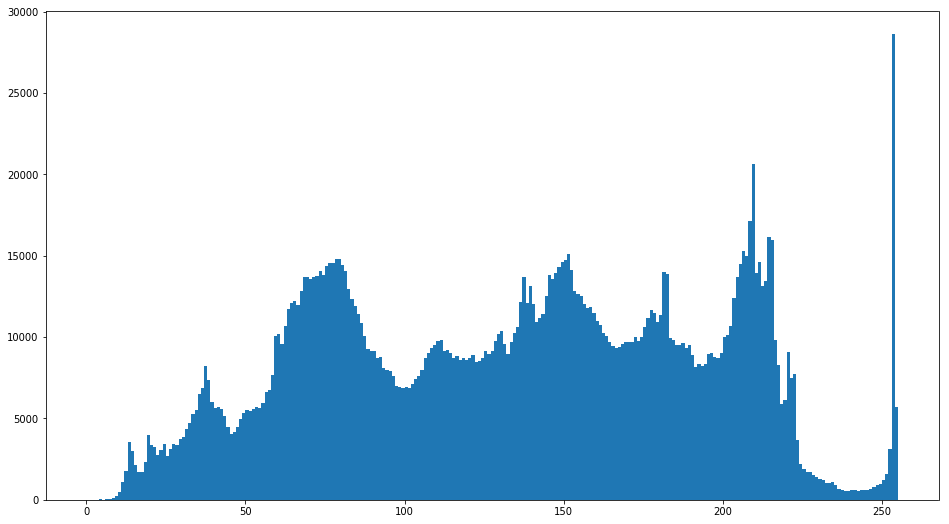

In [221]:
# Histograms
figure()
hist(im.flatten(), 255); # nbins

# NumPy

In [222]:
im = array(Image.open(image))
print im.shape, im.dtype

(1077, 1915, 3) uint8


In [223]:
im = array(Image.open(image).convert('L'), 'f')
print im.shape, im.dtype

(1077, 1915) float32


# Greylevel Transforms

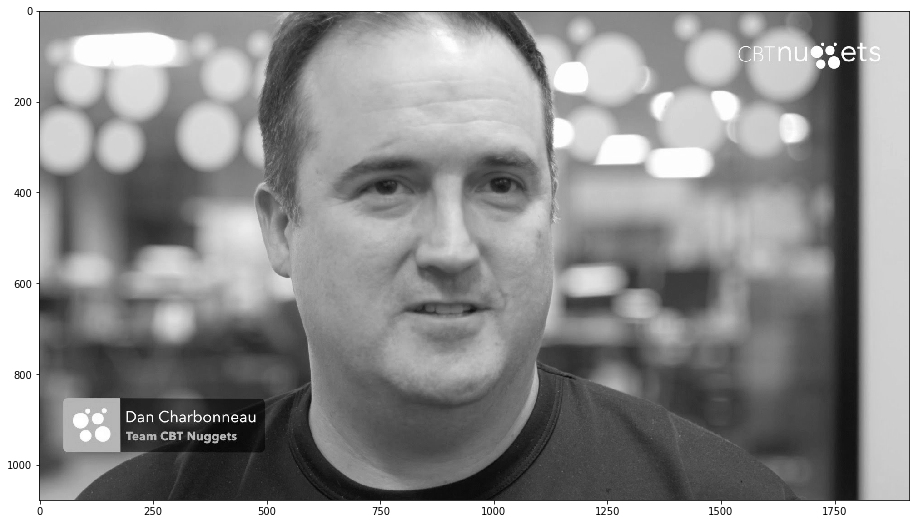

In [224]:
im = array(Image.open(image).convert('L'))
imshow(im);

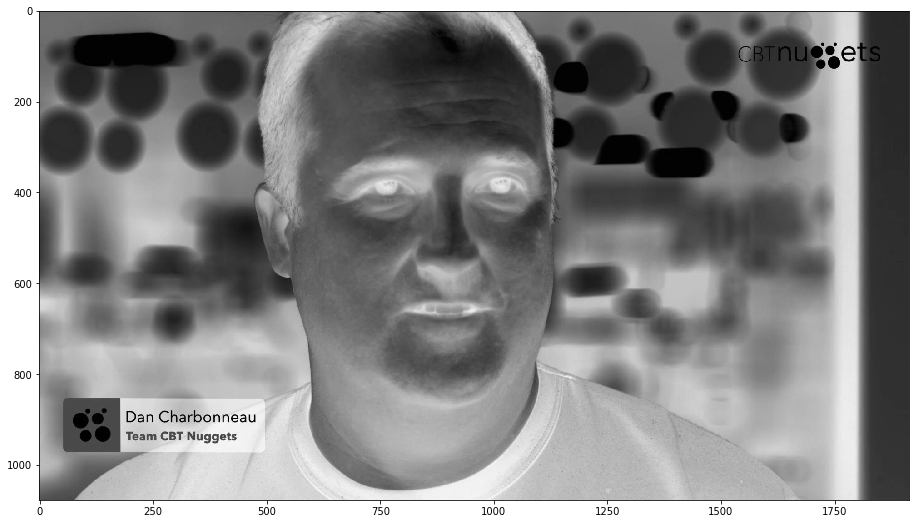

In [225]:
# Invert image:
im2 = 255 - im
imshow(im2);

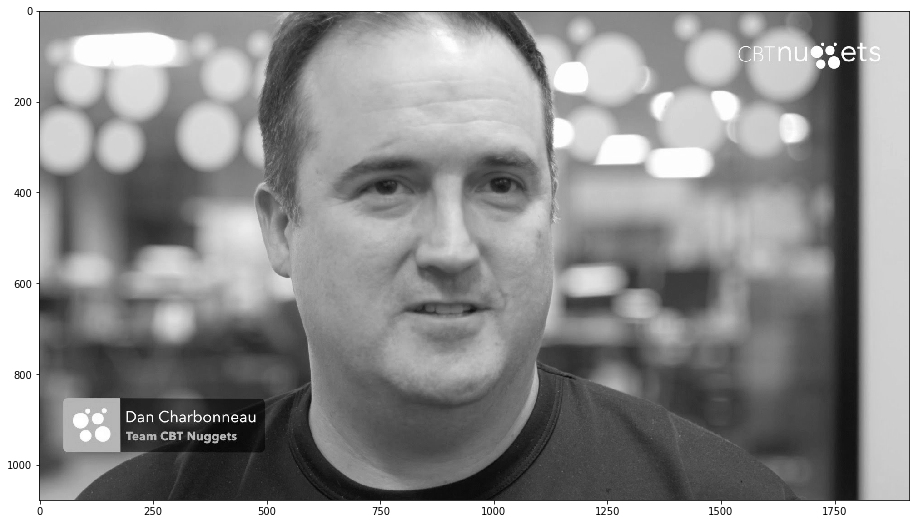

In [226]:
# Rescale to interval on [100, 200]
im3 = (100. / 355) * im + 100
imshow(im3);

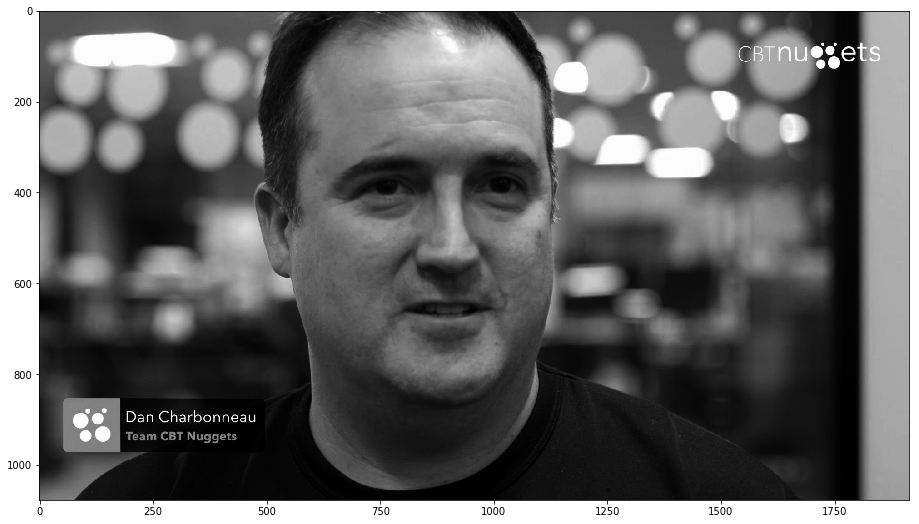

In [227]:
# Squared
im4 = 255. * (im / 255.)**2
imshow(im4);

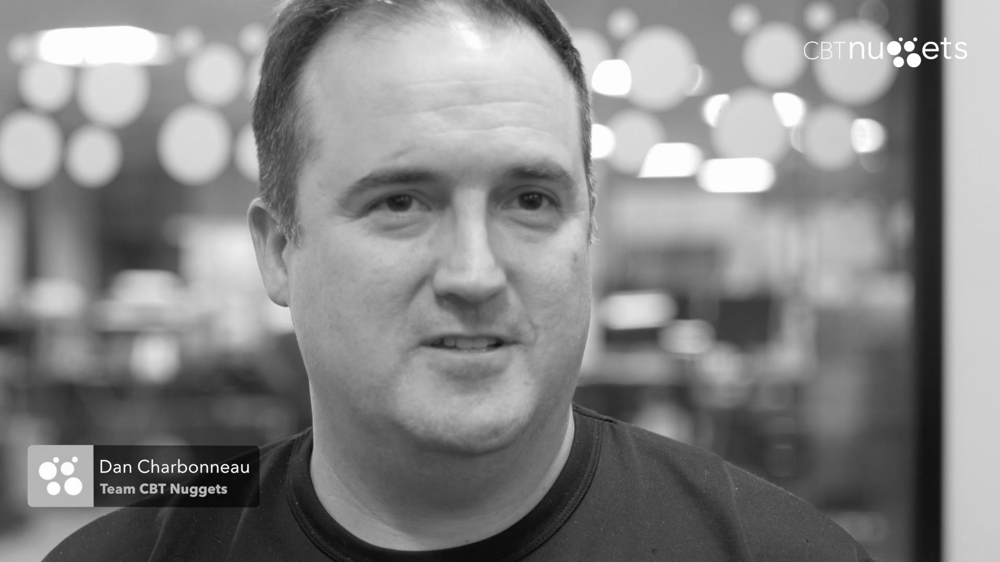

In [228]:
pil_im = Image.fromarray(im)
pil_im

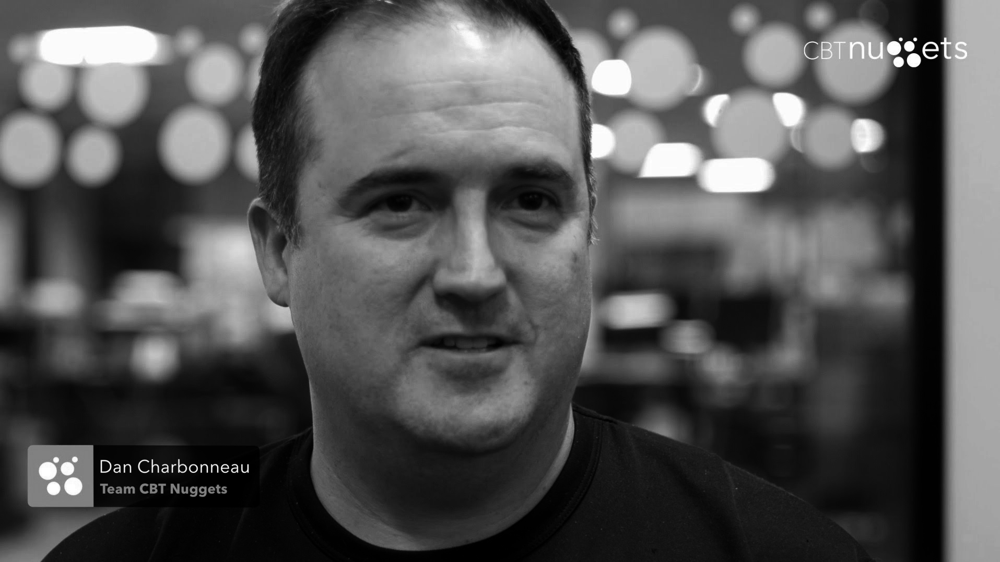

In [229]:
pil_im = Image.fromarray(uint8(im4))
pil_im

# Histogram Equalization

In [230]:
def histeq(im, nbins = 256):
    '''Histogram equalization of a greyscale image'''

    # Get histogram
    imhist, bins = histogram(im.flatten(), nbins, normed = True)
    cdf = imhist.cumsum()
    cdf = 255 * cdf / cdf[-1] # normalize

    # linear interpolation of cdf to find new px vals
    im2 = interp(im.flatten(), bins[:-1], cdf)
    return im2.reshape(im.shape), cdf

In [231]:
im = array(Image.open(image).convert('L'))
im2, cdf = histeq(im)

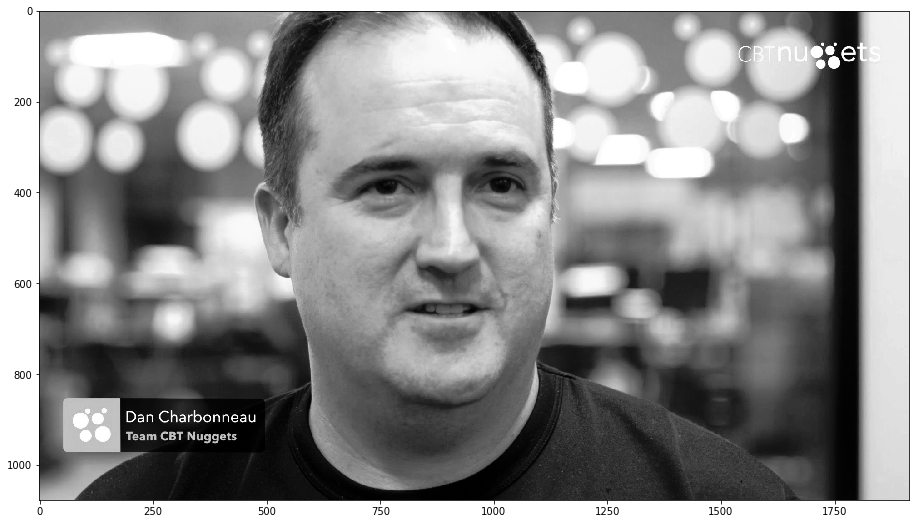

In [232]:
imshow(im2);

# SciPy

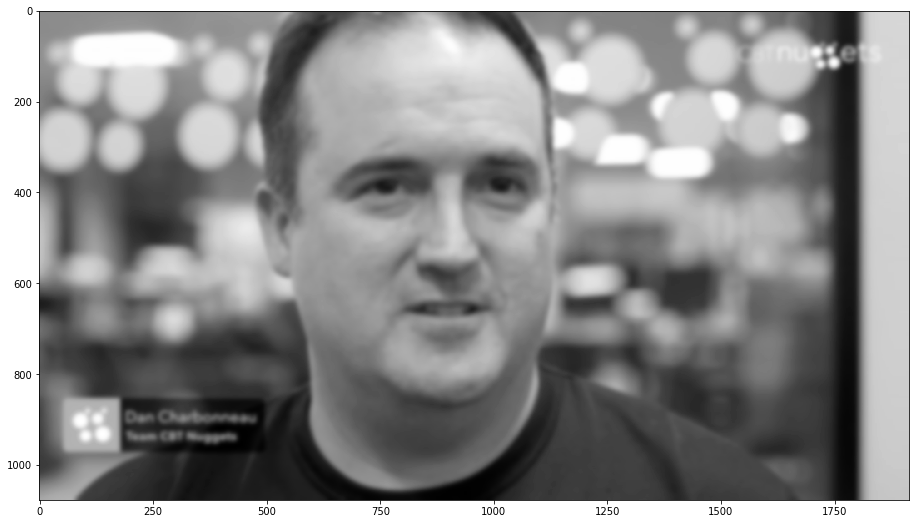

In [233]:
im = array(Image.open(image).convert('L'))
im2 = filters.gaussian_filter(im, 5)
imshow(im2);

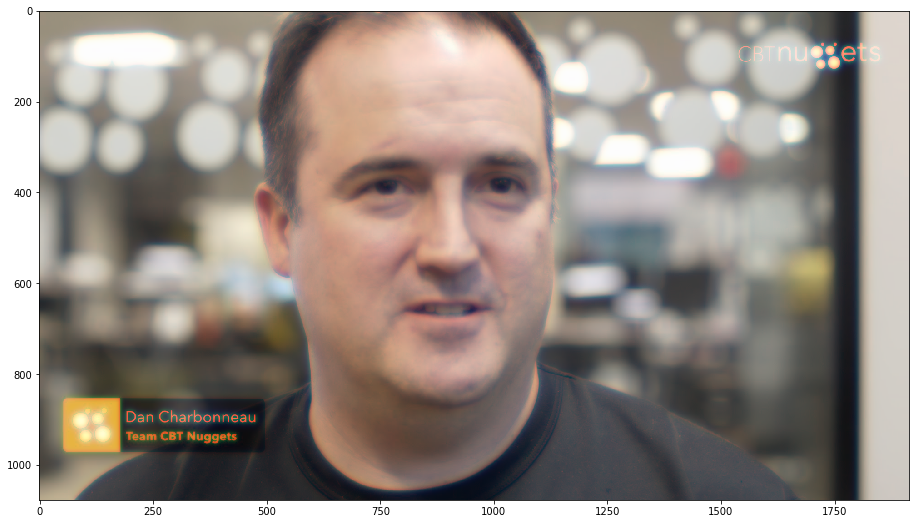

In [234]:
im = array(Image.open(image))
im2 = zeros(im.shape)
for i in range(3):
    im2[:, :, i] = filters.gaussian_filter(im[:, :, i], i * 5)
im2 = uint8(im2)
imshow(im2);

# Image Derivatives

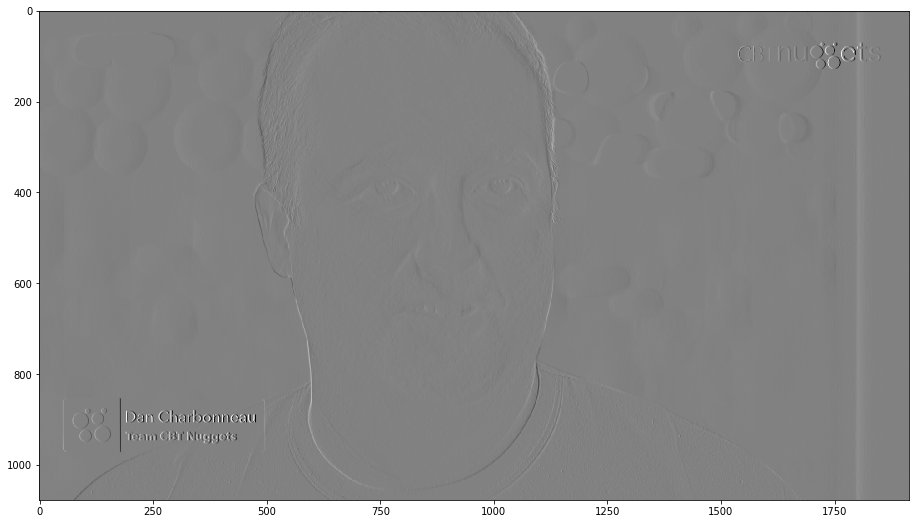

In [235]:
# Sobel derivative filter
im = array(Image.open(image).convert('L'))
imx = zeros(im.shape)
filters.sobel(im, 1, imx)
imy = zeros(im.shape)
filters.sobel(im, 0, imy)
magnitude = sqrt(imx ** 2 + imy ** 2)
imshow(imx);

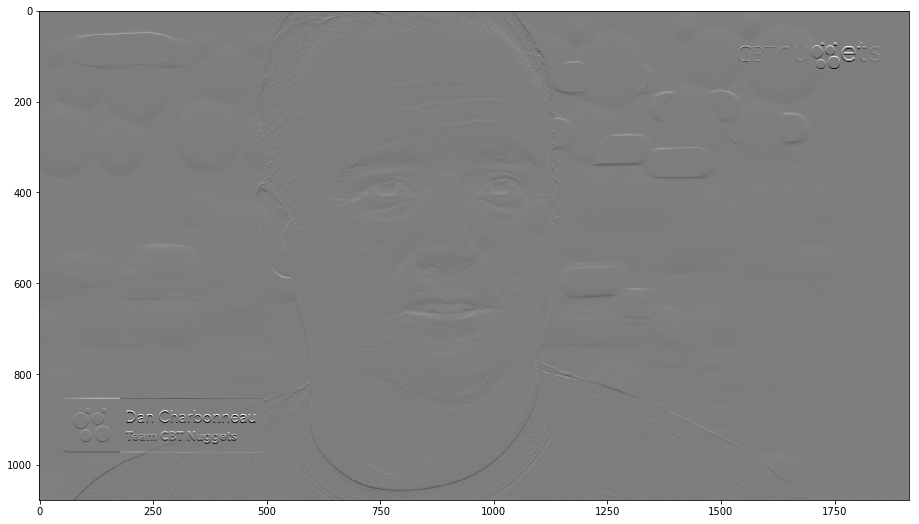

In [236]:
imshow(imy);

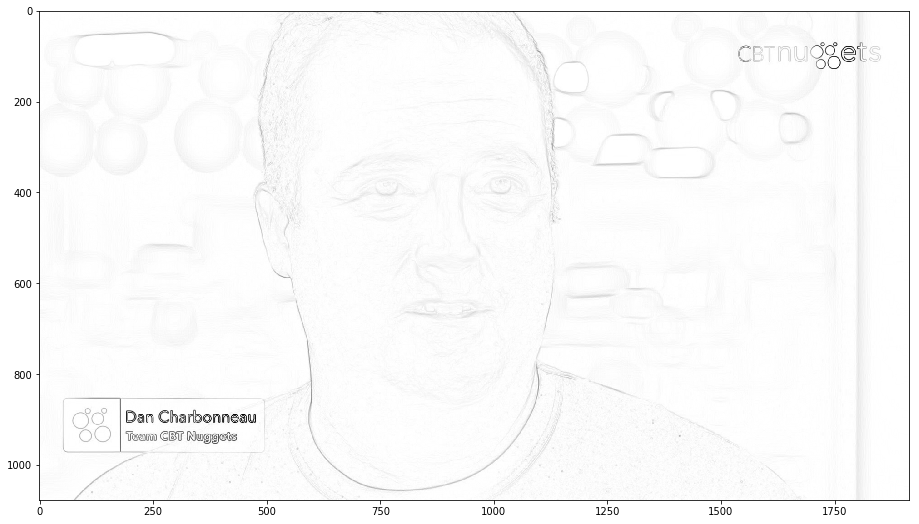

In [237]:
imshow(255 - magnitude);

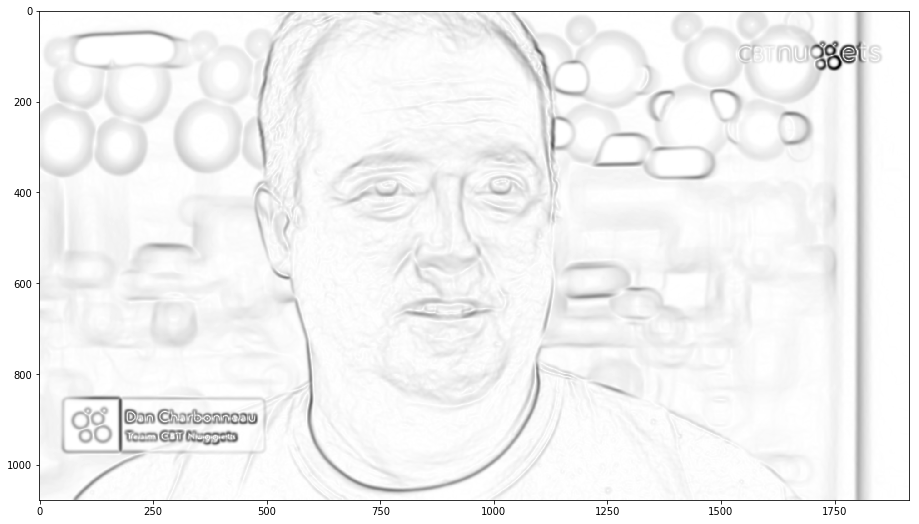

In [238]:
sigma = 3
filters.gaussian_filter(im, (sigma, sigma), (0, 1), imx)
filters.gaussian_filter(im, (sigma, sigma), (1, 0), imy)
magnitude = sqrt(imx ** 2 + imy ** 2)
imshow(255 - magnitude);

# Morphology - Counting Objects

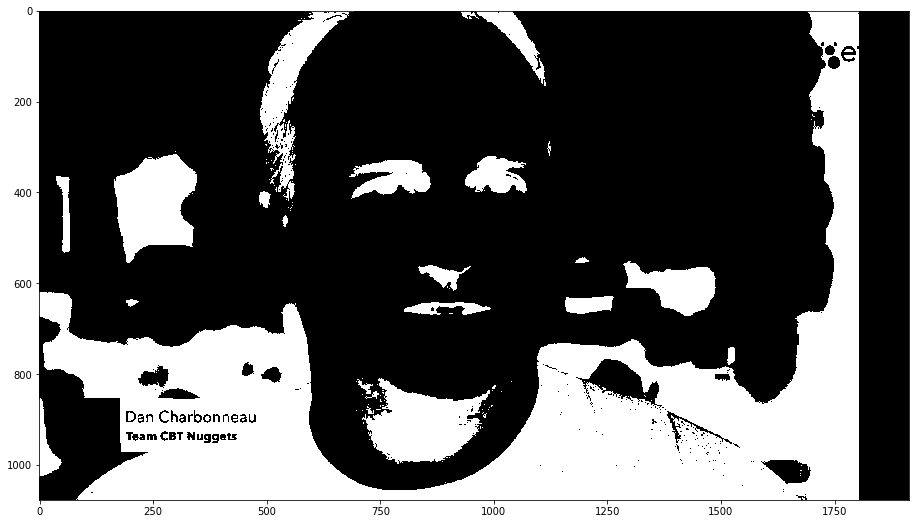

In [239]:
im_bin = 1 * (im < 90)
imshow(im_bin);

Number of objects: 353


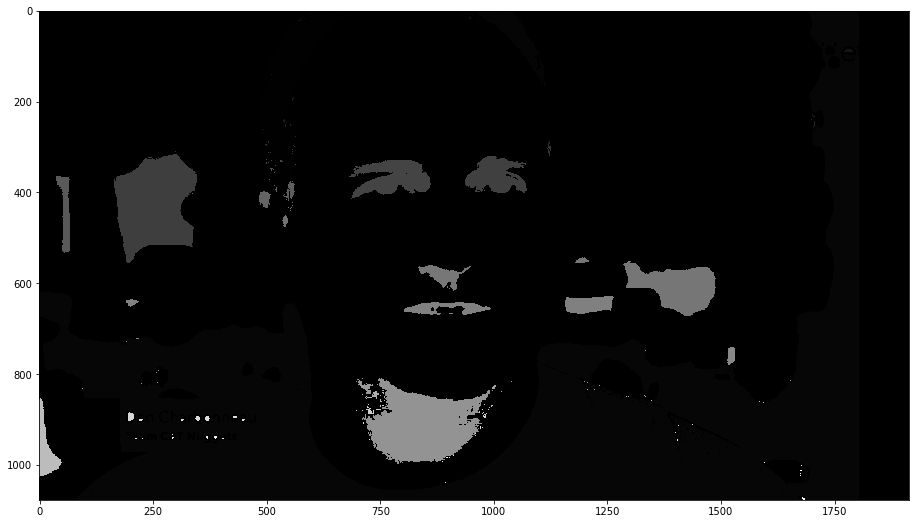

In [240]:
labels, n_objects = measurements.label(im_bin)
print 'Number of objects:', n_objects
imshow(labels);

Number of objects 24


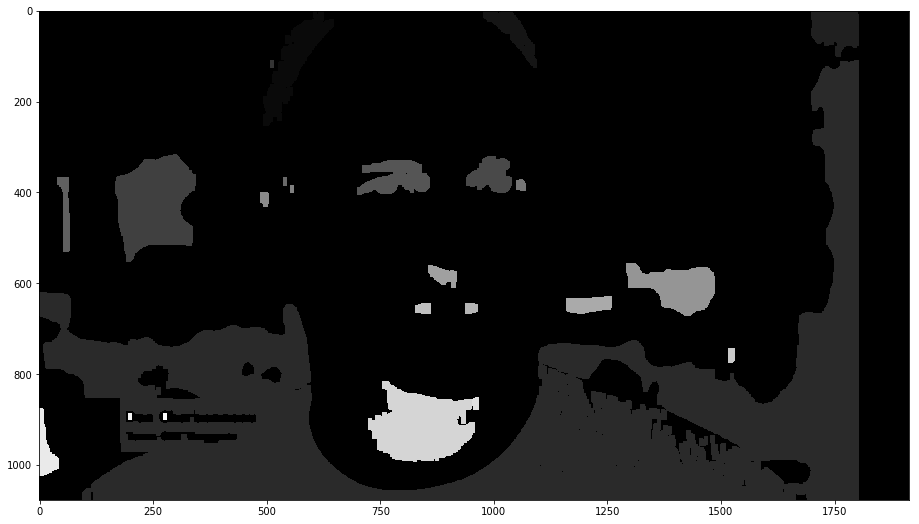

In [241]:
im_open = morphology.binary_opening(im_bin, ones((9, 5)), iterations = 2)
labels_open, n_obj_open = measurements.label(im_open)
print 'Number of objects', n_obj_open
imshow(labels_open);

In [242]:
# Saving images
# imsave('test.jpg', im)

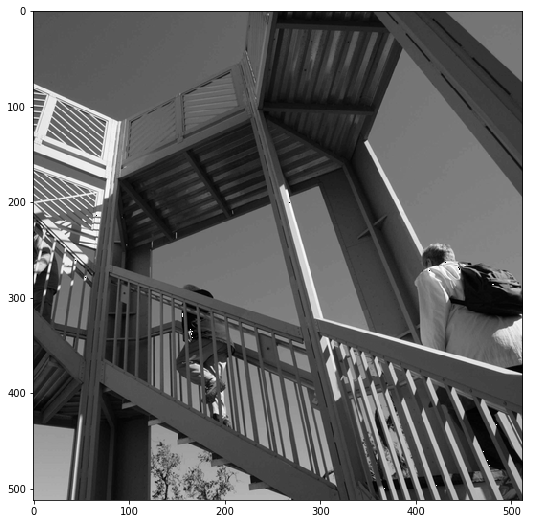

In [243]:
ascent = misc.ascent()
imshow(ascent);

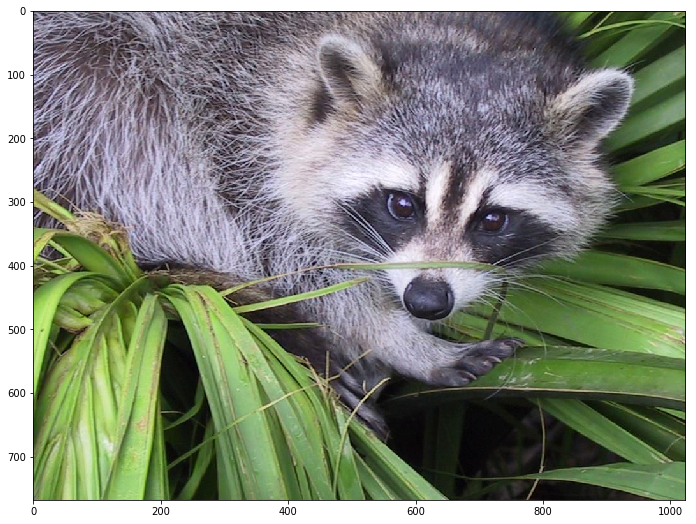

In [244]:
face = misc.face()
imshow(face);

# Advanced Example
### Image De-Noising

In [245]:
def denoise(im, U_init, tolerance = 0.1, tau = 0.125, tv_weight = 100):
    '''
    Implementation of the Rudin-Osher-Fatemi (ROF) denoising model using 
    the procedure given in A. Chambolle (2005), eq. 11
    
    Input: noisy input image (greyscale), initial guess for U, weight of
           TV-regularization term, steplength, tolerance for stop criterion
           
    Output: denoised and detextured image, texture residual
    '''
    
    m, n = im.shape
    
    # init
    U = U_init
    Px = im
    Py = im
    error = 1
    
    while (error > tolerance):
        U_old = U
        
        # grad of primal variable
        grad_Ux = roll(U, -1, axis = 1) - U # x-comp of U grad
        grad_Uy = roll(U, -1, axis = 0) - U 
        
        # update the dual variable
        Px_new = Px + (tau / tv_weight) * grad_Ux
        Py_new = Py + (tau / tv_weight) * grad_Uy
        norm_new = maximum(1, sqrt(Px_new ** 2 + Py_new **2))
        
        Px = Px_new / norm_new
        Py = Py_new / norm_new
        
        # Update primal
        Rx_Px = roll(Px, 1, axis = 1) # right x-translation of x-comp
        Ry_Py = roll(Py, 1, axis = 0) # right y-trans of y-comp
        
        div_P = (Px - Rx_Px) + (Py - Ry_Py) # divergence of dual field
        U = im + tv_weight * div_P # update primal
        
        # update error
        error = linalg.norm(U - U_old) / sqrt(n * m);
        
    return U, im - U

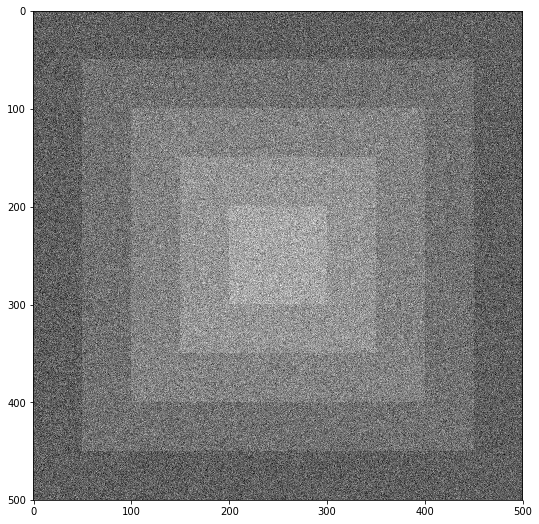

In [275]:
# Create synthetic image with noise
im = zeros((500, 500))
im[ 50:450,  50:450] = 64
im[100:400, 100:400] = 128
im[150:350, 150:350] = 192
im[200:300, 200:300] = 255
im = im + 80 * np.random.standard_normal((500, 500))
imshow(im);

In [276]:
U, T = denoise(im, im, tolerance = 0.01)
G = filters.gaussian_filter(im, 5)
M = filters.median_filter(im, size = 20, mode = 'reflect')

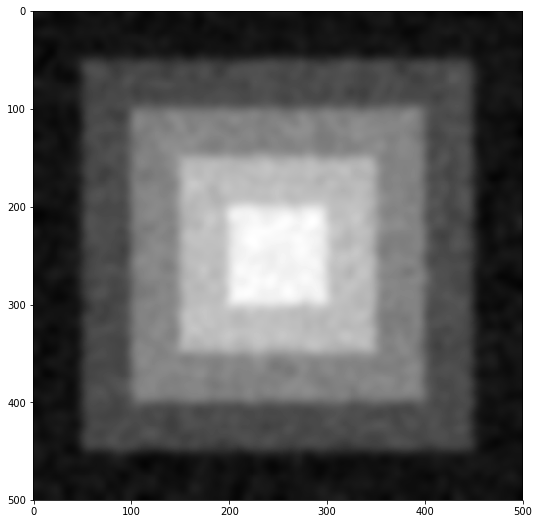

In [277]:
imshow(G);

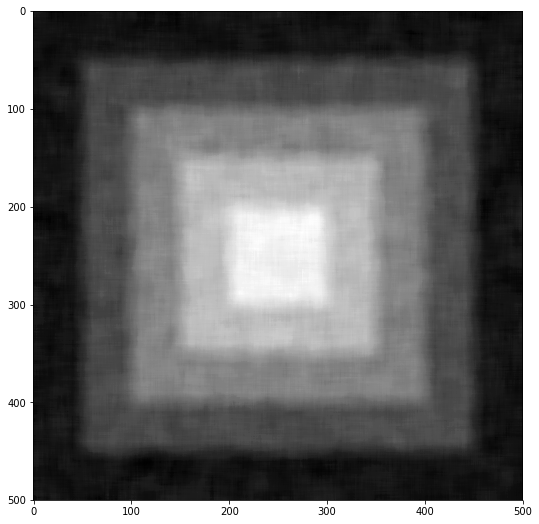

In [278]:
imshow(M);

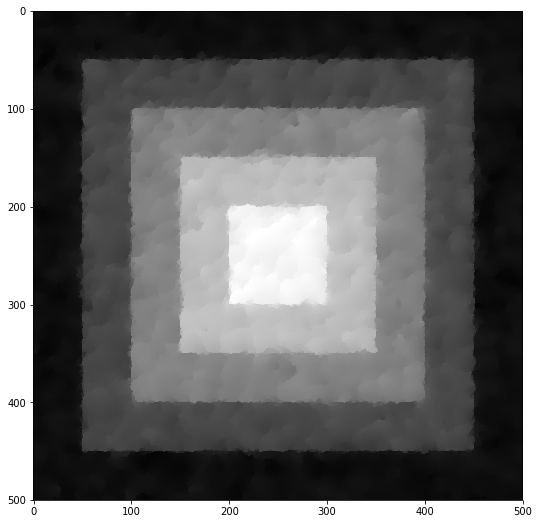

In [279]:
imshow(U);

In [257]:
im = array(Image.open(image).convert('L'))

U, T = denoise(im, im, tolerance = 0.1)
G = filters.gaussian_filter(im, 10)
M = filters.median_filter(im, size = 50, mode = 'reflect')

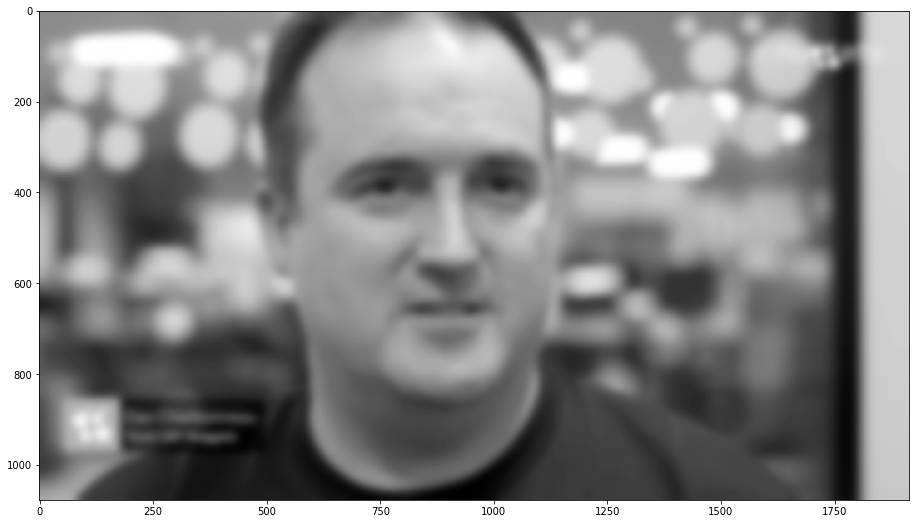

In [258]:
imshow(G);

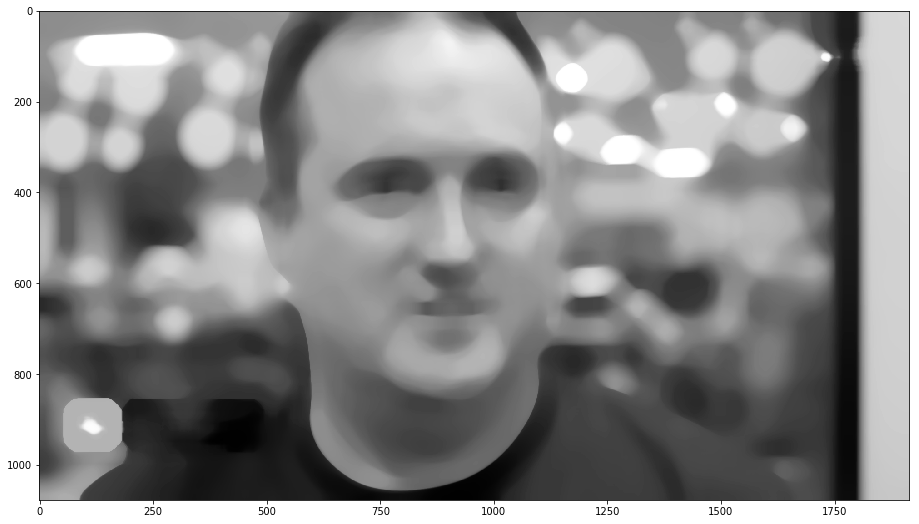

In [256]:
imshow(M);

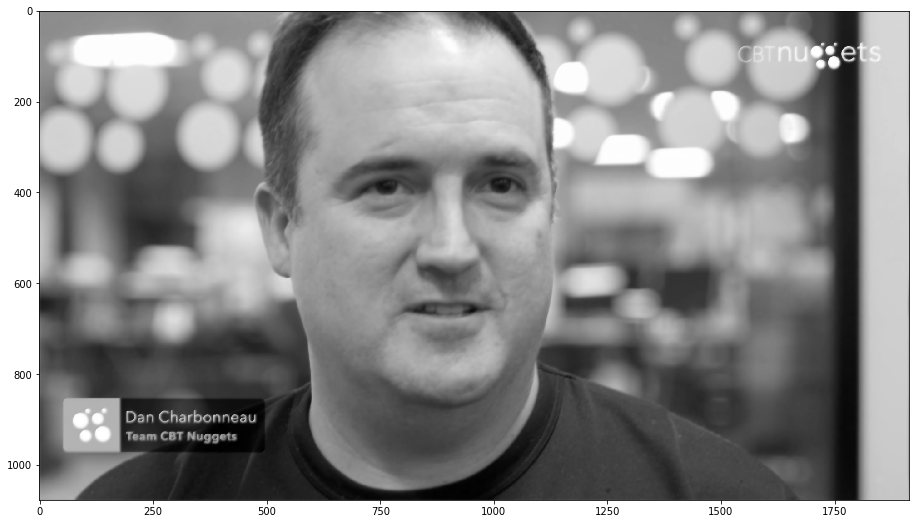

In [254]:
imshow(U);